In [69]:
# imports
!pip install mdct
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.signal import hamming
from scipy.spatial.distance import cdist

import IPython.display as ipd
from mdct.fast import mdct, imdct
from scipy.io.wavfile import write

plt.rcParams['figure.figsize'] = (12,8)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [70]:
# useful functions

def plot_sound(data, rate, title=None):
    if data.ndim == 1:
        data = data[:,np.newaxis]
    times = np.arange(data.shape[0])/rate
    plt.figure(figsize=(30,6))
    for channel in data.T:
        plt.fill_between(times, channel)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.xlim(times[0], times[-1])
    if title:
        plt.title(title)
    plt.show()

def play_sound(data, rate):
    return ipd.Audio(data.T, rate=rate)

T = 220501, M = 2


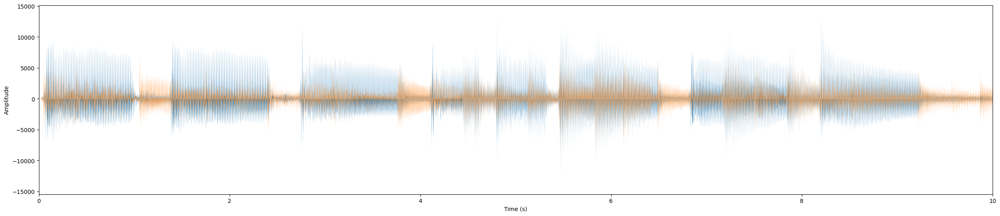

In [71]:
fname = 'mix.wav'

rate, x = wavfile.read(fname)
print('T = {:d}, M = {:d}'.format(*x.shape))
plot_sound(x, rate)
play_sound(x, rate)

In [72]:
write('new_mix.wav', rate, np.array(x, dtype=np.int16)) # to write a new wave file

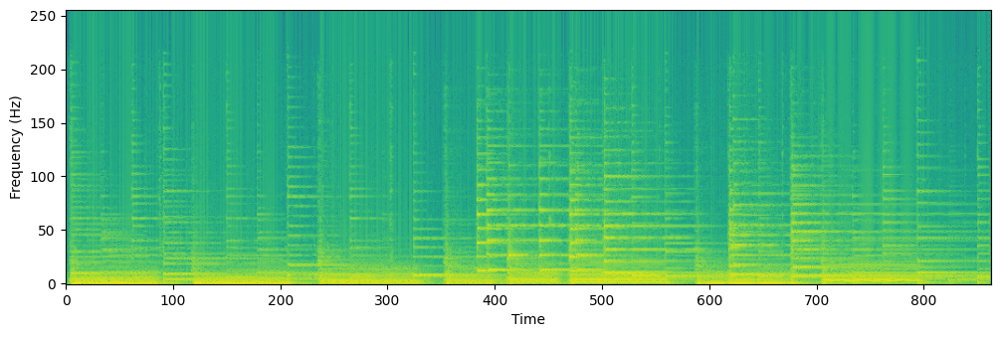

In [73]:
X = mdct(x, window=hamming, framelength=512)
Z = X.view(dtype=np.complex128)[...,0]

X_norm = np.abs(Z)**2

plt.imshow(np.log(X_norm+1e-10), origin='lower')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show()

# Questions

## 1.

In [74]:
T, M = x.shape
print(f'T = {T}, M = {M}')
play_sound(x, rate)

T = 220501, M = 2


We can hear K = 3 instruments: two guitars and a piano. The piano seems to come from everywhere while one of the guitar which plays the high notes seem to come from the right and the other one which plays the lower notes come from the left.



## 2. Dispersion diagram

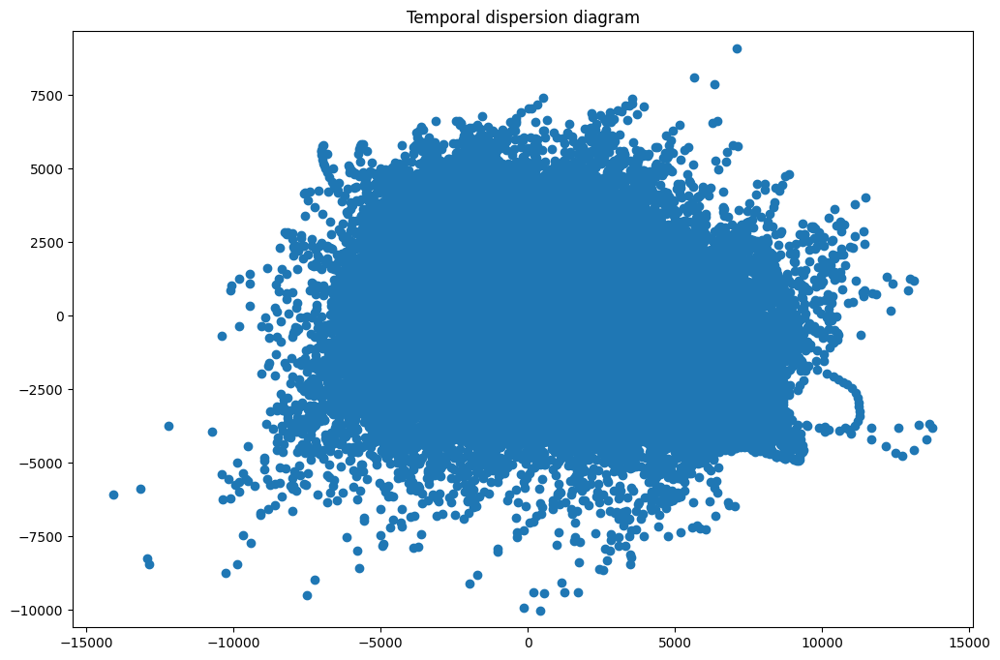

In [75]:
plt.scatter(x[:, 0], x[:, 1])
plt.axis('equal')
plt.title('Temporal dispersion diagram')
plt.show()

We cannot distinguish the directions of the sources at this point.

## 3. MDCT

In [76]:
import scipy

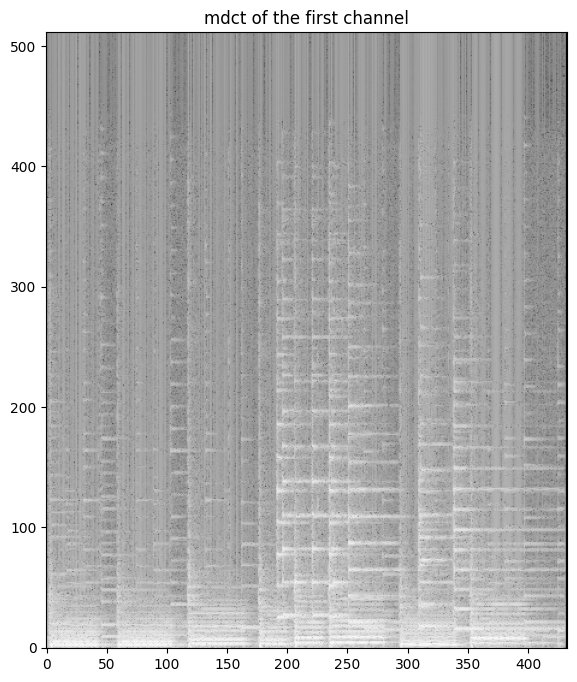

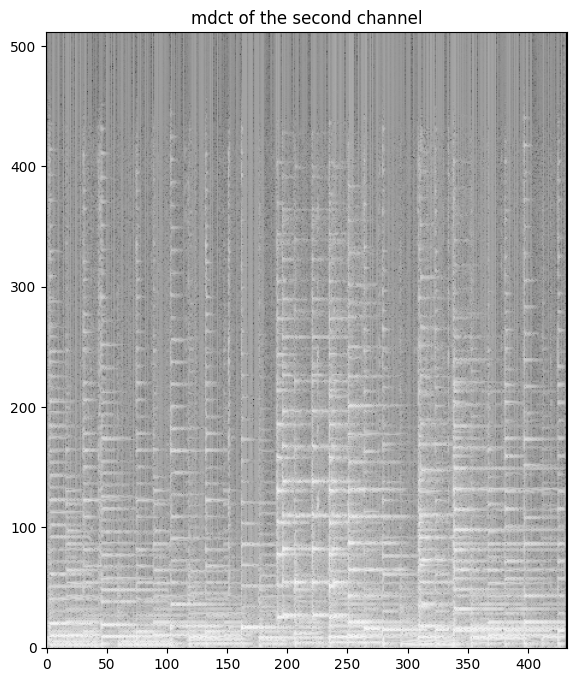

In [77]:
mdct_x = mdct(x, window=scipy.signal.hamming)
plt.imshow(np.log(np.abs(mdct_x[:, :, 0]+1e-6)**2), cmap='gray', origin='lower')
plt.title('mdct of the first channel')
plt.show()
plt.imshow(np.log(np.abs(mdct_x[:, :, 1]+1e-6)**2), origin='lower', cmap='gray')
plt.title('mdct of the second channel')
plt.show()

The vertical lines correspond to the diracs and the horizontal lines correspond to the sinus.

## 4. Time-frequency dispersion diagram

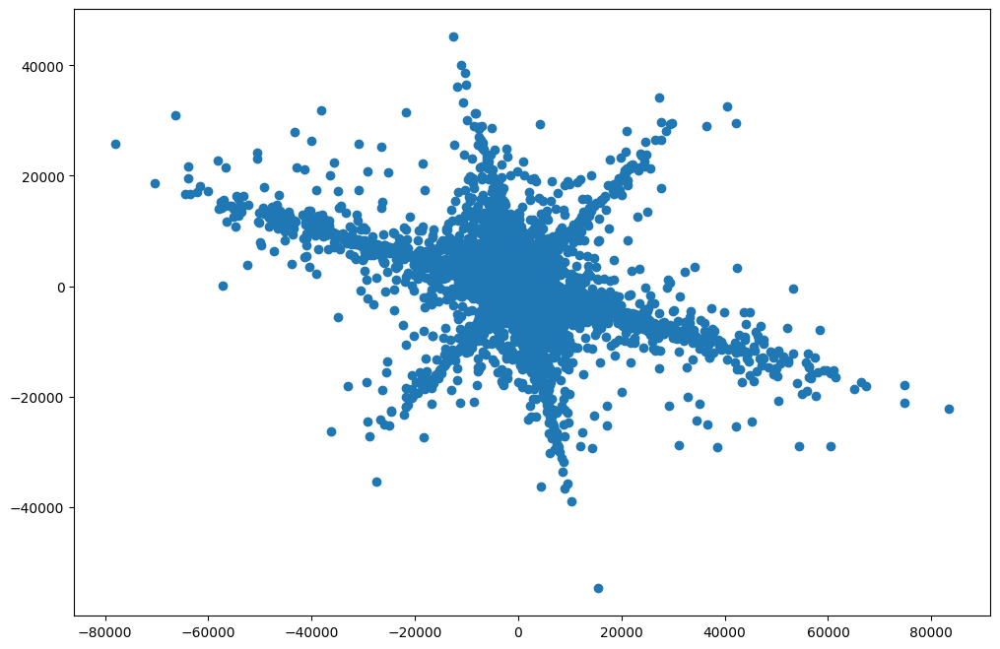

In [78]:
Z = mdct_x[..., 0] + 1j * mdct_x[..., 1]
plt.scatter(mdct_x[..., 0], mdct_x[..., 1])
plt.show()

We clearly see 3 sources. One of the sources have almost only 0 on the horizontal axis and another is the same on the other axis, which means that they mostly come from one side. One is diagonal, that means that it comes from both side.

## 5. Histogram

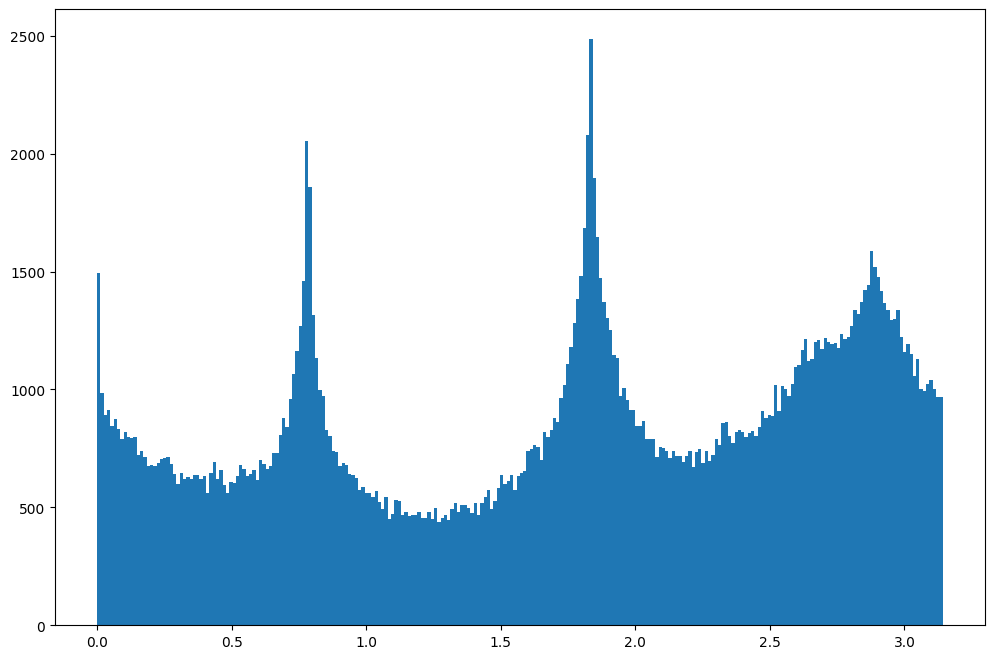

In [79]:
plt.hist(np.angle(Z.flatten()) % np.pi, bins=256)
plt.show()

We see 3 pics, one for each sources. Two of them are near to 0 or $π$ ($\sim 0.8$ and $\sim  2.8$) means that they are more monophonics. And the last source is in the middle ($\sim 1.9$) means that it's the stereo one.

## 6.

In [80]:
teta1 = 0.8
teta2 = 1.9
teta3 = 2.8

f, n = Z.shape
B = np.zeros((f, n, 3))
for k in range(n):
  for f_k in range(f):
    teta_f_k = np.angle(Z[f_k, k])%np.pi
    errors = np.abs(np.array([teta_f_k - teta1, teta_f_k - teta2, teta_f_k - teta3]))
    B[f_k, k, np.argmin(errors)] = 1

## 7.

In [81]:
B.shape

(512, 433, 3)

In [82]:
mdct_x.shape

(512, 433, 2)

In [83]:
B_ext = np.expand_dims(B, axis=2)
B_ext = np.repeat(B_ext, 2, axis=2)
Y = np.zeros((f, n, 2, 3))

mask0 = B_ext[..., 0]
mask1 = B_ext[..., 1]
mask2 = B_ext[..., 2]
Y[:, :, :, 0] = mask0 * mdct_x
Y[:, :, :, 1] = mask1 * mdct_x
Y[:, :, :, 2] = mask2 * mdct_x
y0 = imdct(Y[..., 0])
y1 = imdct(Y[..., 1])
y2 = imdct(Y[..., 2])

/usr/local/lib/python3.10/dist-packages/stft/utils.py:53: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]
/usr/local/lib/python3.10/dist-packages/stft/utils.py:25: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]


# 8. Listen to the new

In [84]:
play_sound(y0, rate)

In [85]:
play_sound(y1, rate)

In [86]:
play_sound(y2, rate)

The reconstruction seems to be well done, although we can still hear some kind of echo, especially for the piano reconstruction.

# 9. MMSE estimator

In [87]:
S = np.zeros((f, n, 3))
for k in range(n):
  for f_k in range(f):
    teta_f_k = np.angle(Z[f_k, k])%np.pi
    S[f_k, k] = np.cos(teta_f_k)*Y[f_k, k, 0] + np.sin(teta_f_k)*Y[f_k, k, 0]

s0 = imdct(S[..., 0])
s1 = imdct(S[..., 1])
s2 = imdct(S[..., 2])

In [88]:
play_sound(s0, rate)

In [89]:
play_sound(s1, rate)

In [90]:
play_sound(s2, rate)

# 10. Modifying the angles

In [91]:
S = np.zeros((f, n, 3))

theta = np.array([np.pi/4, 0, np.pi * 3/4])

for k in range(n):
  for f_k in range(f):
    for id_src in range(3):
      S[f_k, k, id_src] = np.cos(theta[id_src])*Y[f_k, k, 0, id_src] + np.sin(theta[id_src])*Y[f_k, k, 1, id_src]


s0 = imdct(S[..., 0])
s1 = imdct(S[..., 1])
s2 = imdct(S[..., 2])

In [92]:
theta = np.linspace(0, 2*np.pi, 3, endpoint=False)
cos = np.cos(theta)
sin = np.sin(theta)
A = np.column_stack((cos, sin))

X_new = np.zeros_like(mdct_x)
for k in range(n):
  for f_k in range(f):
    X_new[f_k, k] = S[f_k, k] @ A



In [93]:
play_sound(s0, rate)

In [94]:
play_sound(s1, rate)

In [95]:
play_sound(s2, rate)

In [96]:
x_new = imdct(X_new)
play_sound(x_new, rate)

In [97]:
x_new

array([[  0.44255957,  -0.19577652],
       [  0.32390829,  -0.56136338],
       [  0.25346471,  -0.40295949],
       ...,
       [-56.19873258,  87.25661499],
       [-76.40721832,  85.68518167],
       [-93.26217551,  82.83855431]])

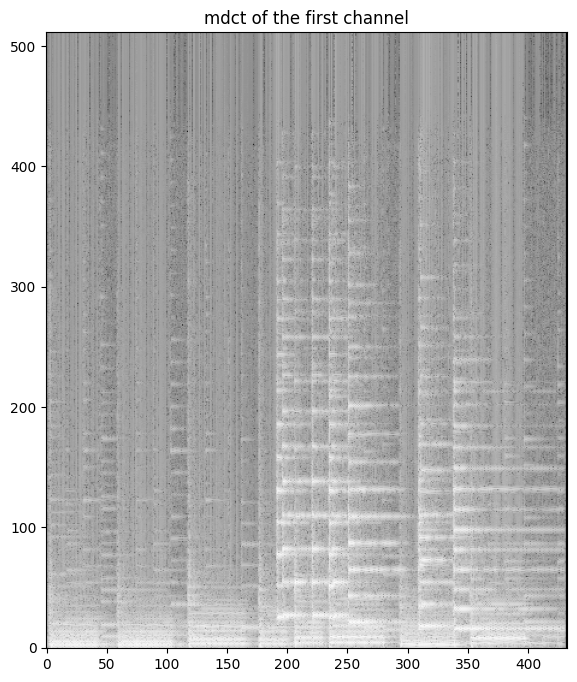

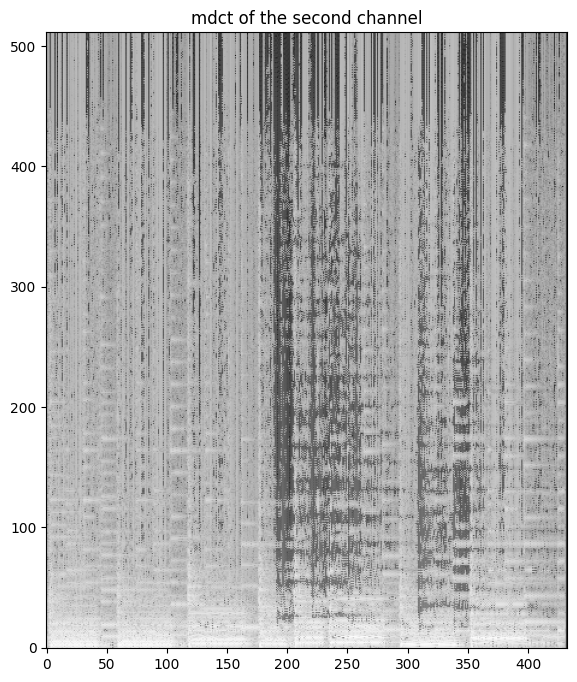

In [99]:
mdct_x_new = mdct(x_new, window=scipy.signal.hamming)
plt.imshow(np.log(np.abs(mdct_x_new[:, :, 0]+1e-6)**2), cmap='gray', origin='lower')
plt.title('mdct of the first channel')
plt.show()
plt.imshow(np.log(np.abs(mdct_x_new[:, :, 1]+1e-6)**2), origin='lower', cmap='gray')
plt.title('mdct of the second channel')
plt.show()

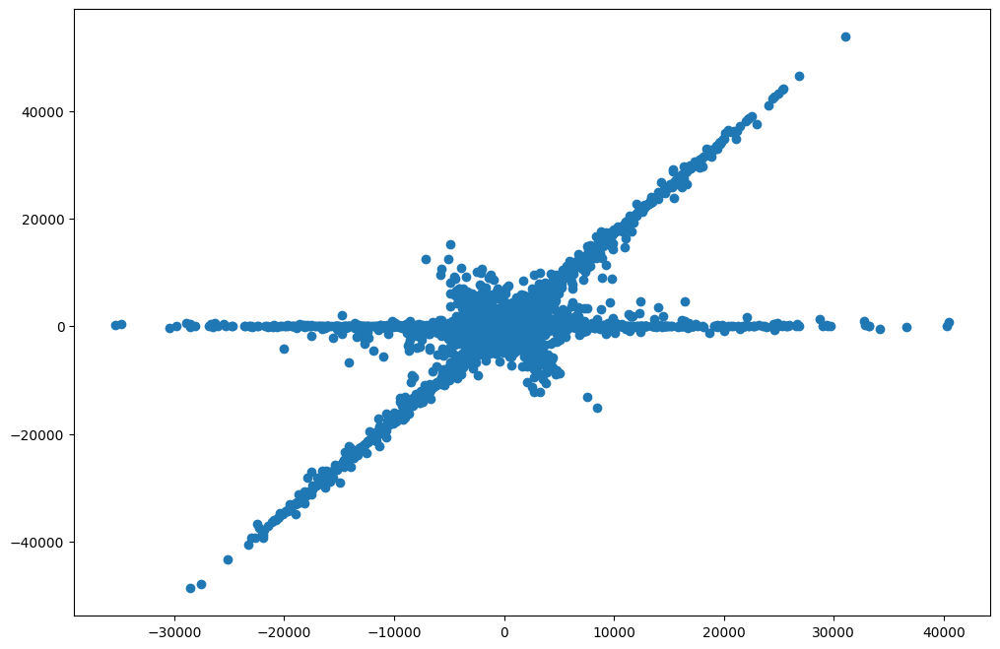

In [100]:
Z_new = mdct_x_new[..., 0] + 1j * mdct_x_new[..., 1]
plt.scatter(mdct_x_new[..., 0], mdct_x_new[..., 1])
plt.show()

Same as before, there seems to be some echoes.